<a href="https://colab.research.google.com/github/batlab-art/Introductions/blob/master/opencv_examples.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

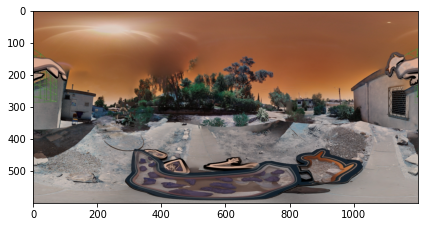

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import imageio

images = []

def showImage(img):
    plt.imshow(img)
    plt.tight_layout()
    plt.show()

ksize = 51

src = cv2.imread('catX.jpg')
blur = cv2.GaussianBlur(src,(51,51),0)

showImage(src)

In [ ]:
small_to_large_image_size_ratio = 0.95 ## .5
sub = src;
for i in range(20): ## 8
  small = cv2.resize(sub, # original image
                     (0,0), # set fx and fy, not the final size
                     fx=small_to_large_image_size_ratio, 
                     fy=small_to_large_image_size_ratio, 
                     interpolation=cv2.INTER_NEAREST)
 ## showImage(small)
  images.append(cv2.resize(small,(800,400),interpolation = cv2.INTER_CUBIC))
  sub = small

sub = src;
for i in range(8):
  small = cv2.resize(sub, # original image
                     (0,0), # set fx and fy, not the final size
                     fx=small_to_large_image_size_ratio, 
                     fy=small_to_large_image_size_ratio, 
                     interpolation=cv2.INTER_CUBIC)
##  showImage(small)
  images.append(cv2.resize(small,(800,400),interpolation = cv2.INTER_CUBIC))
  sub = small

imageio.mimsave('scaleDown.gif', images)

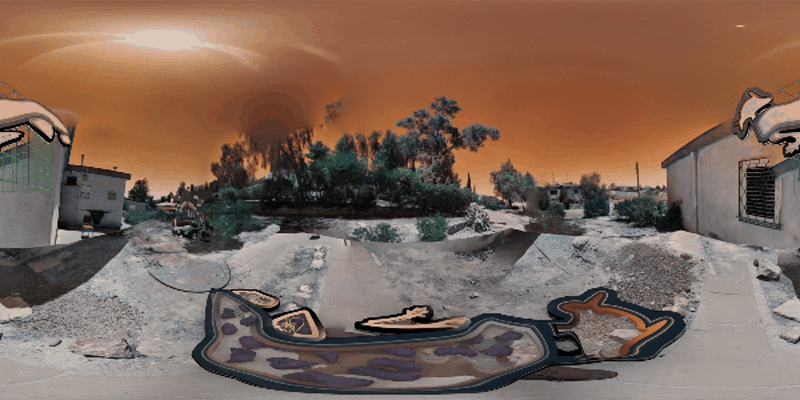

In [ ]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
from IPython import display
from pathlib import Path
gifPath = Path("/content/scaleDown.gif")
# Display GIF in Jupyter, CoLab, IPython
with open(gifPath,'rb') as f:
    display.Image(data=f.read(), format='png')



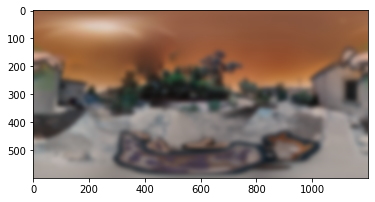

In [ ]:
showImage(blur)

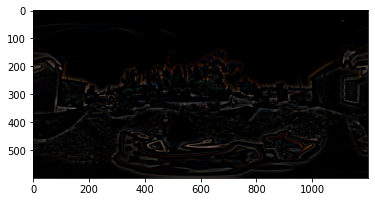

In [ ]:
filtered = cv2.subtract(img,blur)
showImage(filtered)
filtered = img - blur
##



True

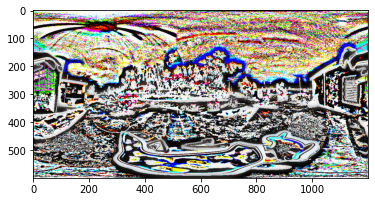

In [ ]:
showImage(filtered)



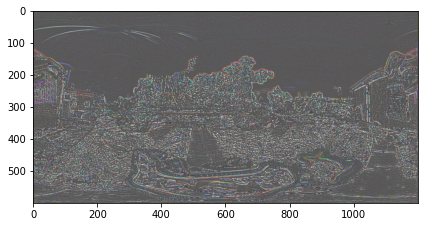

In [ ]:
kernelA = np.ones((3,3), np.uint8)
## filtered = cv2.add(filtered, 127 * np.ones(([4]), np.uint8) / 255.0 )

kernel = np.array([[-1, -1, -1, -1, -1],
                   [-1,  1,  2,  1, -1],
                   [-1,  2,  4,  2, -1],
                   [-1,  1,  2,  1, -1],
                   [-1, -1, -1, -1, -1]]) 

highpass = ( cv2.filter2D(src,-1, cv2.flip(kernel, -1), borderType=cv2.BORDER_CONSTANT)  - 170 ) ##cv2.medianBlur(src,33))
showImage(highpass)


In [ ]:
cv2.imwrite('output.jpg', highpass)

True